<a href="https://colab.research.google.com/github/jhadarsh/SAR-to-EO-Translation_by_cycleGAN/blob/main/SAR_to_EO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
os.listdir('/content/drive/My Drive')


['Colab Notebooks', 'split_dataset']

In [ ]:
file_path = '/content/drive/My Drive/split_dataset'


In [ ]:
os.listdir('/content/drive/My Drive/split_dataset')

['stratified_split', 'random_split', 'geographic_split']

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import rasterio
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import cv2
import glob
import random
from tqdm import tqdm
import itertools
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Set device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")


Using device: cuda


In [ ]:
class Sen12MSDataset(Dataset):
    """Dataset class for Sen12MS SAR and EO data with [-1, 1] normalization"""

    def __init__(self, sar_dir, eo_dir, eo_bands, transform=None):
        """
        Args:
            sar_dir: Directory containing SAR images
            eo_dir: Directory containing EO images
            eo_bands: List of band indices for EO data (e.g., [4,3,2] for RGB)
            transform: Optional transform to be applied
        """
        self.sar_dir = sar_dir
        self.eo_dir = eo_dir
        self.eo_bands = eo_bands
        self.transform = transform

        # Get file lists
        self.sar_files = sorted([f for f in os.listdir(sar_dir) if f.endswith('.tif')])
        self.eo_files = sorted([f for f in os.listdir(eo_dir) if f.endswith('.tif')])

        # Match SAR and EO files by extracting common identifiers
        self.matched_pairs = self._match_files()

        print(f"Found {len(self.sar_files)} SAR files and {len(self.eo_files)} EO files")
        print(f"Successfully matched {len(self.matched_pairs)} pairs")

    def _match_files(self):
        """Match SAR and EO files based on their identifiers"""
        pairs = []

        for sar_file in self.sar_files:
            # Extract identifier (e.g., "94_p598" from filename)
            sar_parts = sar_file.split('_')
            if len(sar_parts) >= 5:
                sar_id = '_'.join(sar_parts[3:5])  # e.g., "94_p598"

                # Find matching EO file
                for eo_file in self.eo_files:
                    if sar_id in eo_file:
                        pairs.append((sar_file, eo_file))
                        break

        return pairs

    def __len__(self):
        return len(self.matched_pairs)

    def __getitem__(self, idx):
        try:
            sar_file, eo_file = self.matched_pairs[idx]

            # Load SAR data
            sar_path = os.path.join(self.sar_dir, sar_file)
            with rasterio.open(sar_path) as src:
                sar_data = src.read()  # Shape: (channels, height, width)

            # Load EO data and select specific bands
            eo_path = os.path.join(self.eo_dir, eo_file)
            with rasterio.open(eo_path) as src:
                eo_data = src.read(self.eo_bands)  # Select specific bands

            # Convert to numpy arrays and handle data types
            sar_data = sar_data.astype(np.float32)
            eo_data = eo_data.astype(np.float32)

            # Handle NaN and infinite values
            sar_data = np.nan_to_num(sar_data, nan=0.0, posinf=1.0, neginf=-1.0)
            eo_data = np.nan_to_num(eo_data, nan=0.0, posinf=1.0, neginf=-1.0)

            # Normalize to [-1, 1] (REQUIRED BY GAN)
            sar_data = self._normalize_to_range(sar_data, -1, 1)
            eo_data = self._normalize_to_range(eo_data, -1, 1)

            # Convert to torch tensors
            sar_tensor = torch.from_numpy(sar_data)
            eo_tensor = torch.from_numpy(eo_data)

            if self.transform:
                sar_tensor = self.transform(sar_tensor)
                eo_tensor = self.transform(eo_tensor)

            return sar_tensor, eo_tensor

        except Exception as e:
            print(f"Error loading sample {idx}: {str(e)}")
            # Return dummy data with correct dimensions
            sar_dummy = torch.zeros((2, 256, 256))
            eo_dummy = torch.zeros((len(self.eo_bands), 256, 256))
            return sar_dummy, eo_dummy

    def _normalize_to_range(self, data, target_min=-1, target_max=1):
        """Normalize data to target range [-1, 1]"""
        data_min = np.min(data)
        data_max = np.max(data)

        if data_max == data_min:
            return np.zeros_like(data)

        # Normalize to [0, 1] first
        normalized = (data - data_min) / (data_max - data_min)

        # Scale to target range [-1, 1]
        return normalized * (target_max - target_min) + target_min

print("Dataset class with [-1, 1] normalization defined!")


Dataset class with [-1, 1] normalization defined!


In [ ]:
class ResidualBlock(nn.Module):
    """Residual block for generator"""

    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels, in_channels, 3),
            nn.InstanceNorm2d(in_channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels, in_channels, 3),
            nn.InstanceNorm2d(in_channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    """CycleGAN Generator with ResNet architecture"""

    def __init__(self, input_channels, output_channels, n_residual_blocks=9):
        super(Generator, self).__init__()

        # Initial convolution block
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_channels, 64, 7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]

        # Downsampling
        in_channels = 64
        for _ in range(2):
            out_channels = in_channels * 2
            model += [
                nn.Conv2d(in_channels, out_channels, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ]
            in_channels = out_channels

        # Residual blocks
        for _ in range(n_residual_blocks):
            model += [ResidualBlock(in_channels)]

        # Upsampling
        for _ in range(2):
            out_channels = in_channels // 2
            model += [
                nn.ConvTranspose2d(in_channels, out_channels, 3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ]
            in_channels = out_channels

        # Output layer with Tanh (outputs [-1, 1])
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, output_channels, 7),
            nn.Tanh()  # Ensures output is in [-1, 1]
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    """PatchGAN Discriminator"""

    def __init__(self, input_channels):
        super(Discriminator, self).__init__()

        def discriminator_block(in_channels, out_channels, normalize=True):
            layers = [nn.Conv2d(in_channels, out_channels, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_channels))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(input_channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, x):
        return self.model(x)

print("CycleGAN architecture defined!")


CycleGAN architecture defined!


In [ ]:
class CycleGAN:
    """Complete CycleGAN model for SAR-to-EO translation"""

    def __init__(self, sar_channels, eo_channels, device='cuda'):
        self.device = device

        # Initialize generators and discriminators
        self.G_AB = Generator(sar_channels, eo_channels).to(device)  # SAR to EO
        self.G_BA = Generator(eo_channels, sar_channels).to(device)  # EO to SAR
        self.D_A = Discriminator(sar_channels).to(device)  # SAR discriminator
        self.D_B = Discriminator(eo_channels).to(device)   # EO discriminator

        # Loss functions
        self.criterion_GAN = nn.MSELoss()
        self.criterion_cycle = nn.L1Loss()

        # Optimizers
        self.optimizer_G = optim.Adam(
            itertools.chain(self.G_AB.parameters(), self.G_BA.parameters()),
            lr=0.0002, betas=(0.5, 0.999)
        )
        self.optimizer_D_A = optim.Adam(self.D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.optimizer_D_B = optim.Adam(self.D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

        print(f"CycleGAN initialized on device: {device}")

    def train_step(self, real_A, real_B, lambda_cycle=10.0):
        """Single training step"""

        # Set gradients to zero
        self.optimizer_G.zero_grad()

        # GAN loss
        fake_B = self.G_AB(real_A)  # SAR -> EO
        pred_fake = self.D_B(fake_B)
        loss_GAN_AB = self.criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        fake_A = self.G_BA(real_B)  # EO -> SAR
        pred_fake = self.D_A(fake_A)
        loss_GAN_BA = self.criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        # Cycle loss
        recov_A = self.G_BA(fake_B)  # SAR -> EO -> SAR
        loss_cycle_A = self.criterion_cycle(recov_A, real_A) * lambda_cycle

        recov_B = self.G_AB(fake_A)  # EO -> SAR -> EO
        loss_cycle_B = self.criterion_cycle(recov_B, real_B) * lambda_cycle

        # Total generator loss
        loss_G = loss_GAN_AB + loss_GAN_BA + loss_cycle_A + loss_cycle_B
        loss_G.backward()
        self.optimizer_G.step()

        # Train Discriminator A
        self.optimizer_D_A.zero_grad()
        pred_real = self.D_A(real_A)
        loss_D_real = self.criterion_GAN(pred_real, torch.ones_like(pred_real))

        pred_fake = self.D_A(fake_A.detach())
        loss_D_fake = self.criterion_GAN(pred_fake, torch.zeros_like(pred_fake))

        loss_D_A = (loss_D_real + loss_D_fake) * 0.5
        loss_D_A.backward()
        self.optimizer_D_A.step()

        # Train Discriminator B
        self.optimizer_D_B.zero_grad()
        pred_real = self.D_B(real_B)
        loss_D_real = self.criterion_GAN(pred_real, torch.ones_like(pred_real))

        pred_fake = self.D_B(fake_B.detach())
        loss_D_fake = self.criterion_GAN(pred_fake, torch.zeros_like(pred_fake))

        loss_D_B = (loss_D_real + loss_D_fake) * 0.5
        loss_D_B.backward()
        self.optimizer_D_B.step()

        return {
            'loss_G': loss_G.item(),
            'loss_D_A': loss_D_A.item(),
            'loss_D_B': loss_D_B.item(),
            'loss_cycle_A': loss_cycle_A.item(),
            'loss_cycle_B': loss_cycle_B.item()
        }

    def generate(self, sar_image):
        """Generate EO image from SAR"""
        self.G_AB.eval()
        with torch.no_grad():
            fake_eo = self.G_AB(sar_image)
        return fake_eo

print("CycleGAN training class defined!")


CycleGAN training class defined!


In [ ]:
def denormalize_image(img_tensor):
    """Convert from [-1, 1] to [0, 1] for visualization and metrics"""
    return (img_tensor + 1.0) / 2.0

def calculate_spectral_metrics(real_eo_batch, fake_eo_batch, config_name):
    """Calculate spectral-wise SSIM, PSNR, and NDVI"""

    batch_ssim = []
    batch_psnr = []
    batch_ndvi = []

    batch_size = real_eo_batch.shape[0]

    for b in range(batch_size):
        real_eo = real_eo_batch[b].cpu().numpy()  # Shape: (channels, height, width)
        fake_eo = fake_eo_batch[b].cpu().numpy()

        # Denormalize from [-1, 1] to [0, 1] for metrics
        real_eo = (real_eo + 1.0) / 2.0
        fake_eo = (fake_eo + 1.0) / 2.0

        channels = real_eo.shape[0]
        ssim_vals = []
        psnr_vals = []

        # Calculate SSIM and PSNR per channel
        for ch in range(channels):
            real_ch = real_eo[ch]
            fake_ch = fake_eo[ch]

            # SSIM calculation
            ssim_val = ssim(real_ch, fake_ch, data_range=1.0)
            ssim_vals.append(ssim_val)

            # PSNR calculation
            psnr_val = psnr(real_ch, fake_ch, data_range=1.0)
            psnr_vals.append(psnr_val)

        batch_ssim.append(ssim_vals)
        batch_psnr.append(psnr_vals)

        # NDVI calculation (if applicable)
        ndvi_diff = None
        if config_name == 'NIR_SWIR_RedEdge':
            # NIR: channel 0 (B8), Red Edge: channel 2 (B5)
            nir_real, nir_fake = real_eo[0], fake_eo[0]
            red_real, red_fake = real_eo[2], fake_eo[2]
            ndvi_diff = calculate_ndvi_difference(nir_real, red_real, nir_fake, red_fake)

        elif config_name == 'RGB_NIR':
            # NIR: channel 3 (B8), Red: channel 0 (B4)
            nir_real, nir_fake = real_eo[3], fake_eo[3]
            red_real, red_fake = real_eo[0], fake_eo[0]
            ndvi_diff = calculate_ndvi_difference(nir_real, red_real, nir_fake, red_fake)

        elif config_name == 'RGB':
            # For RGB, we can use Red (B4) and assume some vegetation index
            # This is less meaningful but provides some comparison
            red_real, red_fake = real_eo[0], fake_eo[0]
            green_real, green_fake = real_eo[1], fake_eo[1]
            # Simple vegetation proxy using Red-Green difference
            veg_real = green_real - red_real
            veg_fake = green_fake - red_fake
            ndvi_diff = np.mean(np.abs(veg_real - veg_fake))

        if ndvi_diff is not None:
            batch_ndvi.append(ndvi_diff)

    return {
        'ssim': np.mean(batch_ssim, axis=0),  # Average across batch
        'psnr': np.mean(batch_psnr, axis=0),
        'ndvi': np.mean(batch_ndvi) if batch_ndvi else None
    }

def calculate_ndvi_difference(nir_real, red_real, nir_fake, red_fake):
    """Calculate NDVI difference between real and fake"""
    epsilon = 1e-10

    # Calculate NDVI for real and fake
    ndvi_real = (nir_real - red_real) / (nir_real + red_real + epsilon)
    ndvi_fake = (nir_fake - red_fake) / (nir_fake + red_fake + epsilon)

    # Return mean absolute difference
    return np.mean(np.abs(ndvi_real - ndvi_fake))

print("Performance metrics functions defined!")


Performance metrics functions defined!


In [ ]:
def visualize_results(model, dataset, config_name, device='cpu', num_samples=3):
    """Visualize SAR-to-EO translation results with proper postprocessing"""

    model.G_AB.eval()

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for i in range(min(num_samples, len(dataset))):
        # Get sample
        sar_img, real_eo = dataset[i]
        sar_batch = sar_img.unsqueeze(0).to(device)

        # Generate fake EO
        with torch.no_grad():
            fake_eo = model.G_AB(sar_batch)

        # Convert to numpy and postprocess (denormalize from [-1,1] to [0,1])
        sar_np = denormalize_image(sar_img).cpu().numpy()
        real_eo_np = denormalize_image(real_eo).cpu().numpy()
        fake_eo_np = denormalize_image(fake_eo.squeeze(0)).cpu().numpy()

        # Display SAR (use first channel)
        axes[i, 0].imshow(sar_np[0], cmap='gray', vmin=0, vmax=1)
        axes[i, 0].set_title(f'SAR Input {i+1}')
        axes[i, 0].axis('off')

        # Display real EO
        if real_eo_np.shape[0] >= 3:
            # For RGB visualization, use first 3 channels
            real_rgb = np.transpose(real_eo_np[:3], (1, 2, 0))
            real_rgb = np.clip(real_rgb, 0, 1)
            axes[i, 1].imshow(real_rgb)
        else:
            axes[i, 1].imshow(real_eo_np[0], cmap='viridis', vmin=0, vmax=1)
        axes[i, 1].set_title(f'Real EO {i+1} ({config_name})')
        axes[i, 1].axis('off')

        # Display fake EO
        if fake_eo_np.shape[0] >= 3:
            fake_rgb = np.transpose(fake_eo_np[:3], (1, 2, 0))
            fake_rgb = np.clip(fake_rgb, 0, 1)
            axes[i, 2].imshow(fake_rgb)
        else:
            axes[i, 2].imshow(fake_eo_np[0], cmap='viridis', vmin=0, vmax=1)
        axes[i, 2].set_title(f'Generated EO {i+1} ({config_name})')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

def plot_training_metrics(all_metrics):
    """Plot comprehensive training metrics for all configurations"""

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))

    configs = list(all_metrics.keys())
    colors = ['blue', 'red', 'green']

    # SSIM plots
    for i, config in enumerate(configs):
        metrics = all_metrics[config]
        if 'ssim_history' in metrics:
            ssim_data = np.array(metrics['ssim_history'])
            for ch in range(ssim_data.shape[1]):
                axes[0, 0].plot(ssim_data[:, ch],
                               label=f'{config} Ch{ch+1}',
                               color=colors[i],
                               linestyle='-' if ch == 0 else '--')

    axes[0, 0].set_title('Spectral SSIM Evolution')
    axes[0, 0].set_ylabel('SSIM')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # PSNR plots
    for i, config in enumerate(configs):
        metrics = all_metrics[config]
        if 'psnr_history' in metrics:
            psnr_data = np.array(metrics['psnr_history'])
            for ch in range(psnr_data.shape[1]):
                axes[0, 1].plot(psnr_data[:, ch],
                               label=f'{config} Ch{ch+1}',
                               color=colors[i],
                               linestyle='-' if ch == 0 else '--')

    axes[0, 1].set_title('Spectral PSNR Evolution')
    axes[0, 1].set_ylabel('PSNR (dB)')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # NDVI plots
    for i, config in enumerate(configs):
        metrics = all_metrics[config]
        if 'ndvi_history' in metrics and metrics['ndvi_history']:
            axes[0, 2].plot(metrics['ndvi_history'],
                           label=f'{config}',
                           color=colors[i],
                           marker='o')

    axes[0, 2].set_title('NDVI Difference Evolution')
    axes[0, 2].set_ylabel('NDVI Difference')
    axes[0, 2].legend()
    axes[0, 2].grid(True)

    # Training losses
    for i, config in enumerate(configs):
        metrics = all_metrics[config]
        if 'losses' in metrics:
            axes[1, 0].plot(metrics['losses']['loss_G'],
                           label=f'{config} Generator',
                           color=colors[i])
            axes[1, 1].plot(metrics['losses']['loss_cycle_A'],
                           label=f'{config} Cycle A',
                           color=colors[i])
            axes[1, 2].plot(metrics['losses']['loss_cycle_B'],
                           label=f'{config} Cycle B',
                           color=colors[i])

    axes[1, 0].set_title('Generator Loss')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    axes[1, 1].set_title('Cycle Loss A (SAR→EO→SAR)')
    axes[1, 1].set_ylabel('Loss')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    axes[1, 2].set_title('Cycle Loss B (EO→SAR→EO)')
    axes[1, 2].set_ylabel('Loss')
    axes[1, 2].legend()
    axes[1, 2].grid(True)

    plt.tight_layout()
    plt.show()

print("Visualization functions defined!")


Visualization functions defined!


In [ ]:
def train_all_configurations(base_path, split_type='stratified_split', num_epochs=2, batch_size=2):
    """
    Train CycleGAN for all three configurations with your folder structure

    Args:
        base_path: Base path to your dataset
        split_type: 'stratified_split', 'geographic_split', or 'random_split'
        num_epochs: Number of training epochs
        batch_size: Training batch size
    """

    # Configurations
    configs = {
        'RGB': {
            'eo_bands': [4, 3, 2],  # B4 (Red), B3 (Green), B2 (Blue)
            'eo_channels': 3,
            'description': 'SAR → EO (RGB: B4, B3, B2)'
        },
        'NIR_SWIR_RedEdge': {
            'eo_bands': [8, 11, 5],  # B8 (NIR), B11 (SWIR), B5 (Red Edge)
            'eo_channels': 3,
            'description': 'SAR → EO (NIR, SWIR, Red Edge: B8, B11, B5)'
        },
        'RGB_NIR': {
            'eo_bands': [4, 3, 2, 8],  # B4, B3, B2, B8
            'eo_channels': 4,
            'description': 'SAR → EO (RGB + NIR: B4, B3, B2, B8)'
        }
    }

    # Dataset paths
    train_sar_dir = os.path.join(base_path, split_type, 'train', 'SAR')
    train_eo_dir = os.path.join(base_path, split_type, 'train', 'EO')

    print(f"Training with {split_type} split")
    print(f"SAR directory: {train_sar_dir}")
    print(f"EO directory: {train_eo_dir}")

    all_results = {}
    all_metrics = {}

    for config_name, config in configs.items():
        print(f"\n{'='*80}")
        print(f"Training Configuration: {config_name}")
        print(f"Description: {config['description']}")
        print(f"{'='*80}")

        # Create dataset
        dataset = Sen12MSDataset(
            sar_dir=train_sar_dir,
            eo_dir=train_eo_dir,
            eo_bands=config['eo_bands']
        )

        if len(dataset) == 0:
            print(f"❌ No data found for {config_name}")
            continue

        # Create dataloader
        dataloader = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=0,
            drop_last=True
        )

        # Get channel information
        sar_sample, eo_sample = dataset[0]
        sar_channels = sar_sample.shape[0]
        eo_channels = config['eo_channels']

        print(f"Dataset: {len(dataset)} samples")
        print(f"Channels: SAR={sar_channels}, EO={eo_channels}")

        # Initialize model
        model = CycleGAN(sar_channels, eo_channels, device=device)

        # Training metrics storage
        training_metrics = {
            'losses': {
                'loss_G': [],
                'loss_D_A': [],
                'loss_D_B': [],
                'loss_cycle_A': [],
                'loss_cycle_B': []
            },
            'ssim_history': [],
            'psnr_history': [],
            'ndvi_history': []
        }

        # Training loop
        print(f"\n🚀 Training for {num_epochs} epochs...")

        for epoch in range(num_epochs):
            print(f"\nEpoch {epoch+1}/{num_epochs}")
            print("-" * 40)

            model.G_AB.train()
            model.G_BA.train()
            model.D_A.train()
            model.D_B.train()

            epoch_losses = {
                'loss_G': 0.0,
                'loss_D_A': 0.0,
                'loss_D_B': 0.0,
                'loss_cycle_A': 0.0,
                'loss_cycle_B': 0.0
            }

            epoch_ssim = []
            epoch_psnr = []
            epoch_ndvi = []

            num_batches = 0

            for batch_idx, (real_sar, real_eo) in enumerate(tqdm(dataloader,
                                                                 desc=f"Epoch {epoch+1}")):
                # Move to device
                real_sar = real_sar.to(device)
                real_eo = real_eo.to(device)

                # Training step
                batch_losses = model.train_step(real_sar, real_eo)

                # Accumulate losses
                for key in epoch_losses:
                    epoch_losses[key] += batch_losses[key]
                num_batches += 1

                # Calculate metrics every few batches
                if batch_idx % max(1, len(dataloader) // 4) == 0:
                    model.G_AB.eval()
                    with torch.no_grad():
                        fake_eo = model.G_AB(real_sar)
                    model.G_AB.train()

                    batch_metrics = calculate_spectral_metrics(
                        real_eo, fake_eo, config_name
                    )

                    epoch_ssim.append(batch_metrics['ssim'])
                    epoch_psnr.append(batch_metrics['psnr'])
                    if batch_metrics['ndvi'] is not None:
                        epoch_ndvi.append(batch_metrics['ndvi'])

            # Average losses and metrics for epoch
            for key in epoch_losses:
                epoch_losses[key] /= num_batches
                training_metrics['losses'][key].append(epoch_losses[key])

            if epoch_ssim:
                training_metrics['ssim_history'].append(np.mean(epoch_ssim, axis=0))
                training_metrics['psnr_history'].append(np.mean(epoch_psnr, axis=0))

            if epoch_ndvi:
                training_metrics['ndvi_history'].append(np.mean(epoch_ndvi))

            # Print epoch results
            print(f"Generator Loss: {epoch_losses['loss_G']:.4f}")
            print(f"Cycle Loss: {(epoch_losses['loss_cycle_A'] + epoch_losses['loss_cycle_B'])/2:.4f}")
            if epoch_ssim:
                print(f"Avg SSIM: {np.mean(training_metrics['ssim_history'][-1]):.4f}")
                print(f"Avg PSNR: {np.mean(training_metrics['psnr_history'][-1]):.2f} dB")
            if epoch_ndvi:
                print(f"NDVI Diff: {training_metrics['ndvi_history'][-1]:.4f}")

        # Store results
        all_results[config_name] = {
            'model': model,
            'dataset': dataset
        }
        all_metrics[config_name] = training_metrics

        print(f"✅ {config_name} training completed!")

        # Visualize results for this configuration
        print(f"\n📊 Visualizing {config_name} results...")
        visualize_results(model, dataset, config_name, device, num_samples=3)

    return all_results, all_metrics

print("Main training function defined!")


Main training function defined!


🚀 Starting CycleGAN training for all configurations...
📋 Configurations to train:
  1. SAR → EO (RGB: B4, B3, B2)
  2. SAR → EO (NIR, SWIR, Red Edge: B8, B11, B5)
  3. SAR → EO (RGB + NIR: B4, B3, B2, B8)
📁 Using stratified_split
⏱️ Training for 2 epochs each
🖥️ Device: cuda
Training with stratified_split split
SAR directory: /content/drive/My Drive/split_dataset/stratified_split/train/SAR
EO directory: /content/drive/My Drive/split_dataset/stratified_split/train/EO

Training Configuration: RGB
Description: SAR → EO (RGB: B4, B3, B2)
Found 132 SAR files and 132 EO files
Successfully matched 132 pairs
Dataset: 132 samples
Channels: SAR=2, EO=3
CycleGAN initialized on device: cuda

🚀 Training for 10 epochs...

Epoch 1/10
----------------------------------------


Epoch 1: 100%|██████████| 66/66 [00:53<00:00,  1.23it/s]


Generator Loss: 6.2874
Cycle Loss: 2.6315
Avg SSIM: 0.1193
Avg PSNR: 14.66 dB
NDVI Diff: 0.1553

Epoch 2/10
----------------------------------------


Epoch 2: 100%|██████████| 66/66 [00:54<00:00,  1.22it/s]


Generator Loss: 6.2620
Cycle Loss: 2.5540
Avg SSIM: 0.2028
Avg PSNR: 17.26 dB
NDVI Diff: 0.0879

Epoch 3/10
----------------------------------------


Epoch 3: 100%|██████████| 66/66 [00:54<00:00,  1.22it/s]


Generator Loss: 5.8397
Cycle Loss: 2.3869
Avg SSIM: 0.1926
Avg PSNR: 16.12 dB
NDVI Diff: 0.1261

Epoch 4/10
----------------------------------------


Epoch 4: 100%|██████████| 66/66 [00:54<00:00,  1.22it/s]


Generator Loss: 5.6063
Cycle Loss: 2.3287
Avg SSIM: 0.2151
Avg PSNR: 16.32 dB
NDVI Diff: 0.1185

Epoch 5/10
----------------------------------------


Epoch 5: 100%|██████████| 66/66 [00:54<00:00,  1.21it/s]


Generator Loss: 5.4818
Cycle Loss: 2.2899
Avg SSIM: 0.2142
Avg PSNR: 16.27 dB
NDVI Diff: 0.1329

Epoch 6/10
----------------------------------------


Epoch 6: 100%|██████████| 66/66 [00:54<00:00,  1.22it/s]


Generator Loss: 5.3617
Cycle Loss: 2.2465
Avg SSIM: 0.2427
Avg PSNR: 17.14 dB
NDVI Diff: 0.0950

Epoch 7/10
----------------------------------------


Epoch 7: 100%|██████████| 66/66 [00:54<00:00,  1.21it/s]


Generator Loss: 5.3528
Cycle Loss: 2.2338
Avg SSIM: 0.2406
Avg PSNR: 15.79 dB
NDVI Diff: 0.1690

Epoch 8/10
----------------------------------------


Epoch 8: 100%|██████████| 66/66 [00:54<00:00,  1.22it/s]


Generator Loss: 5.3328
Cycle Loss: 2.2220
Avg SSIM: 0.2443
Avg PSNR: 16.51 dB
NDVI Diff: 0.1059

Epoch 9/10
----------------------------------------


Epoch 9: 100%|██████████| 66/66 [00:54<00:00,  1.22it/s]


Generator Loss: 5.2821
Cycle Loss: 2.1790
Avg SSIM: 0.2154
Avg PSNR: 15.44 dB
NDVI Diff: 0.1287

Epoch 10/10
----------------------------------------


Epoch 10: 100%|██████████| 66/66 [00:54<00:00,  1.21it/s]


Generator Loss: 5.2569
Cycle Loss: 2.1648
Avg SSIM: 0.2157
Avg PSNR: 15.88 dB
NDVI Diff: 0.1290
✅ RGB training completed!

📊 Visualizing RGB results...


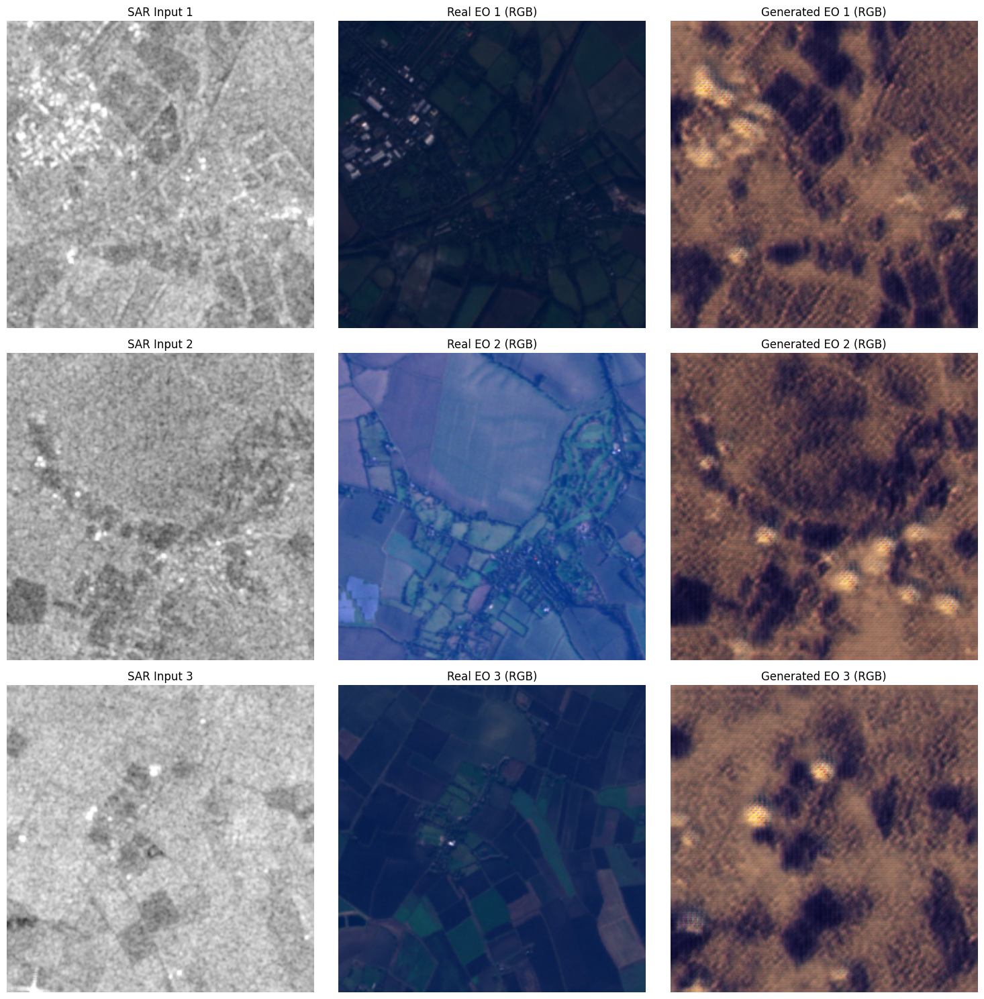


Training Configuration: NIR_SWIR_RedEdge
Description: SAR → EO (NIR, SWIR, Red Edge: B8, B11, B5)
Found 132 SAR files and 132 EO files
Successfully matched 132 pairs
Dataset: 132 samples
Channels: SAR=2, EO=3
CycleGAN initialized on device: cuda

🚀 Training for 10 epochs...

Epoch 1/10
----------------------------------------


Epoch 1: 100%|██████████| 66/66 [00:54<00:00,  1.20it/s]


Generator Loss: 5.9710
Cycle Loss: 2.5245
Avg SSIM: 0.2005
Avg PSNR: 18.85 dB
NDVI Diff: 0.2406

Epoch 2/10
----------------------------------------


Epoch 2: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 5.5783
Cycle Loss: 2.2932
Avg SSIM: 0.3423
Avg PSNR: 24.87 dB
NDVI Diff: 0.1933

Epoch 3/10
----------------------------------------


Epoch 3: 100%|██████████| 66/66 [00:55<00:00,  1.20it/s]


Generator Loss: 5.3721
Cycle Loss: 2.1813
Avg SSIM: 0.3701
Avg PSNR: 27.15 dB
NDVI Diff: 0.2040

Epoch 4/10
----------------------------------------


Epoch 4: 100%|██████████| 66/66 [00:55<00:00,  1.20it/s]


Generator Loss: 5.1758
Cycle Loss: 2.1363
Avg SSIM: 0.2864
Avg PSNR: 22.04 dB
NDVI Diff: 0.2384

Epoch 5/10
----------------------------------------


Epoch 5: 100%|██████████| 66/66 [00:54<00:00,  1.20it/s]


Generator Loss: 4.9739
Cycle Loss: 2.1051
Avg SSIM: 0.3584
Avg PSNR: 25.40 dB
NDVI Diff: 0.1656

Epoch 6/10
----------------------------------------


Epoch 6: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 5.0074
Cycle Loss: 2.0863
Avg SSIM: 0.3017
Avg PSNR: 24.63 dB
NDVI Diff: 0.2126

Epoch 7/10
----------------------------------------


Epoch 7: 100%|██████████| 66/66 [00:54<00:00,  1.20it/s]


Generator Loss: 4.8854
Cycle Loss: 2.0328
Avg SSIM: 0.4030
Avg PSNR: 27.71 dB
NDVI Diff: 0.1810

Epoch 8/10
----------------------------------------


Epoch 8: 100%|██████████| 66/66 [00:55<00:00,  1.20it/s]


Generator Loss: 4.7621
Cycle Loss: 2.0023
Avg SSIM: 0.3343
Avg PSNR: 23.68 dB
NDVI Diff: 0.2108

Epoch 9/10
----------------------------------------


Epoch 9: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 4.8740
Cycle Loss: 2.0329
Avg SSIM: 0.4216
Avg PSNR: 25.98 dB
NDVI Diff: 0.1849

Epoch 10/10
----------------------------------------


Epoch 10: 100%|██████████| 66/66 [00:55<00:00,  1.20it/s]


Generator Loss: 4.9081
Cycle Loss: 2.0241
Avg SSIM: 0.4445
Avg PSNR: 26.81 dB
NDVI Diff: 0.2156
✅ NIR_SWIR_RedEdge training completed!

📊 Visualizing NIR_SWIR_RedEdge results...


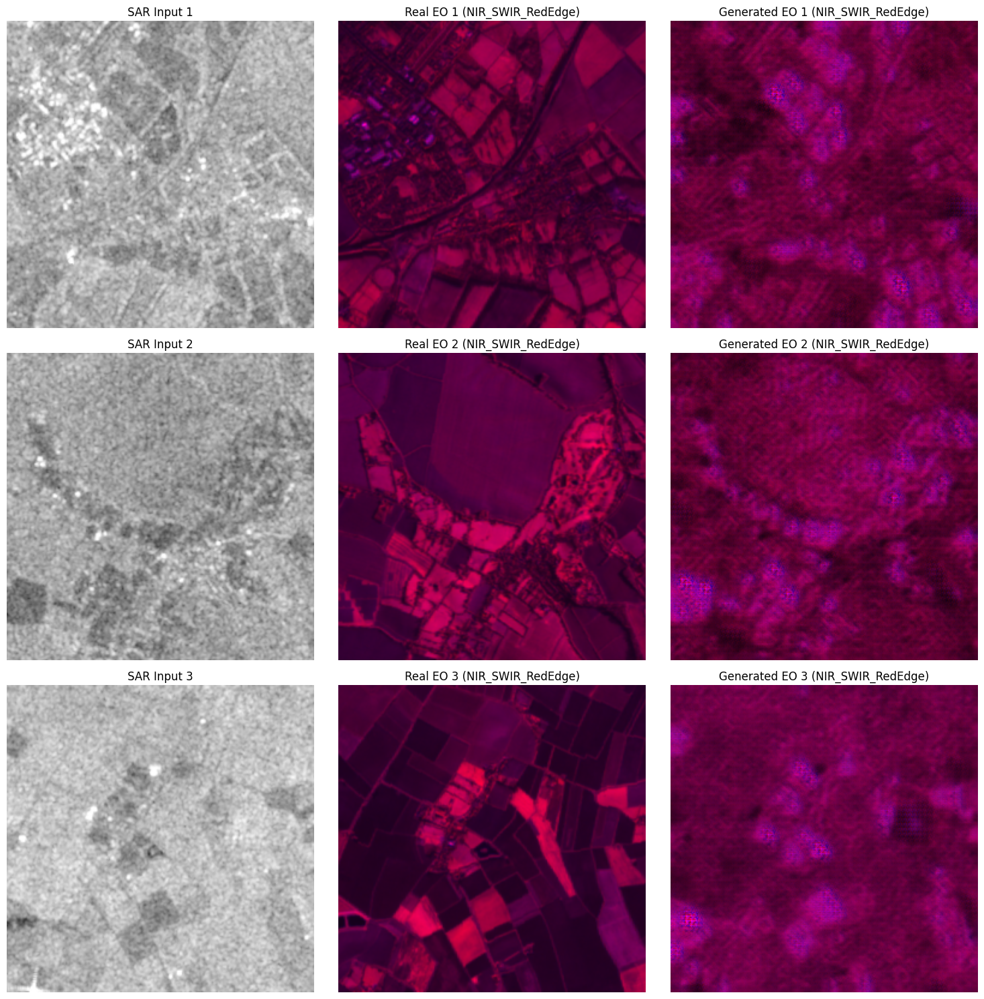


Training Configuration: RGB_NIR
Description: SAR → EO (RGB + NIR: B4, B3, B2, B8)
Found 132 SAR files and 132 EO files
Successfully matched 132 pairs
Dataset: 132 samples
Channels: SAR=2, EO=4
CycleGAN initialized on device: cuda

🚀 Training for 10 epochs...

Epoch 1/10
----------------------------------------


Epoch 1: 100%|██████████| 66/66 [00:55<00:00,  1.18it/s]


Generator Loss: 5.9307
Cycle Loss: 2.5098
Avg SSIM: 0.1514
Avg PSNR: 15.45 dB
NDVI Diff: 0.2459

Epoch 2/10
----------------------------------------


Epoch 2: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 5.7557
Cycle Loss: 2.3345
Avg SSIM: 0.2098
Avg PSNR: 16.80 dB
NDVI Diff: 0.3592

Epoch 3/10
----------------------------------------


Epoch 3: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 5.5740
Cycle Loss: 2.2975
Avg SSIM: 0.1980
Avg PSNR: 16.99 dB
NDVI Diff: 0.2700

Epoch 4/10
----------------------------------------


Epoch 4: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 5.5077
Cycle Loss: 2.2450
Avg SSIM: 0.2043
Avg PSNR: 16.62 dB
NDVI Diff: 0.2849

Epoch 5/10
----------------------------------------


Epoch 5: 100%|██████████| 66/66 [00:55<00:00,  1.18it/s]


Generator Loss: 5.3484
Cycle Loss: 2.1782
Avg SSIM: 0.2928
Avg PSNR: 17.27 dB
NDVI Diff: 0.2633

Epoch 6/10
----------------------------------------


Epoch 6: 100%|██████████| 66/66 [00:55<00:00,  1.18it/s]


Generator Loss: 5.0107
Cycle Loss: 2.0866
Avg SSIM: 0.2455
Avg PSNR: 15.40 dB
NDVI Diff: 0.3079

Epoch 7/10
----------------------------------------


Epoch 7: 100%|██████████| 66/66 [00:55<00:00,  1.18it/s]


Generator Loss: 4.9059
Cycle Loss: 2.0129
Avg SSIM: 0.2616
Avg PSNR: 16.91 dB
NDVI Diff: 0.3624

Epoch 8/10
----------------------------------------


Epoch 8: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 4.9379
Cycle Loss: 2.0114
Avg SSIM: 0.2602
Avg PSNR: 17.46 dB
NDVI Diff: 0.2147

Epoch 9/10
----------------------------------------


Epoch 9: 100%|██████████| 66/66 [00:55<00:00,  1.18it/s]


Generator Loss: 4.8943
Cycle Loss: 2.0059
Avg SSIM: 0.1894
Avg PSNR: 16.66 dB
NDVI Diff: 0.2386

Epoch 10/10
----------------------------------------


Epoch 10: 100%|██████████| 66/66 [00:55<00:00,  1.19it/s]


Generator Loss: 5.1048
Cycle Loss: 2.0869
Avg SSIM: 0.3101
Avg PSNR: 18.12 dB
NDVI Diff: 0.2579
✅ RGB_NIR training completed!

📊 Visualizing RGB_NIR results...


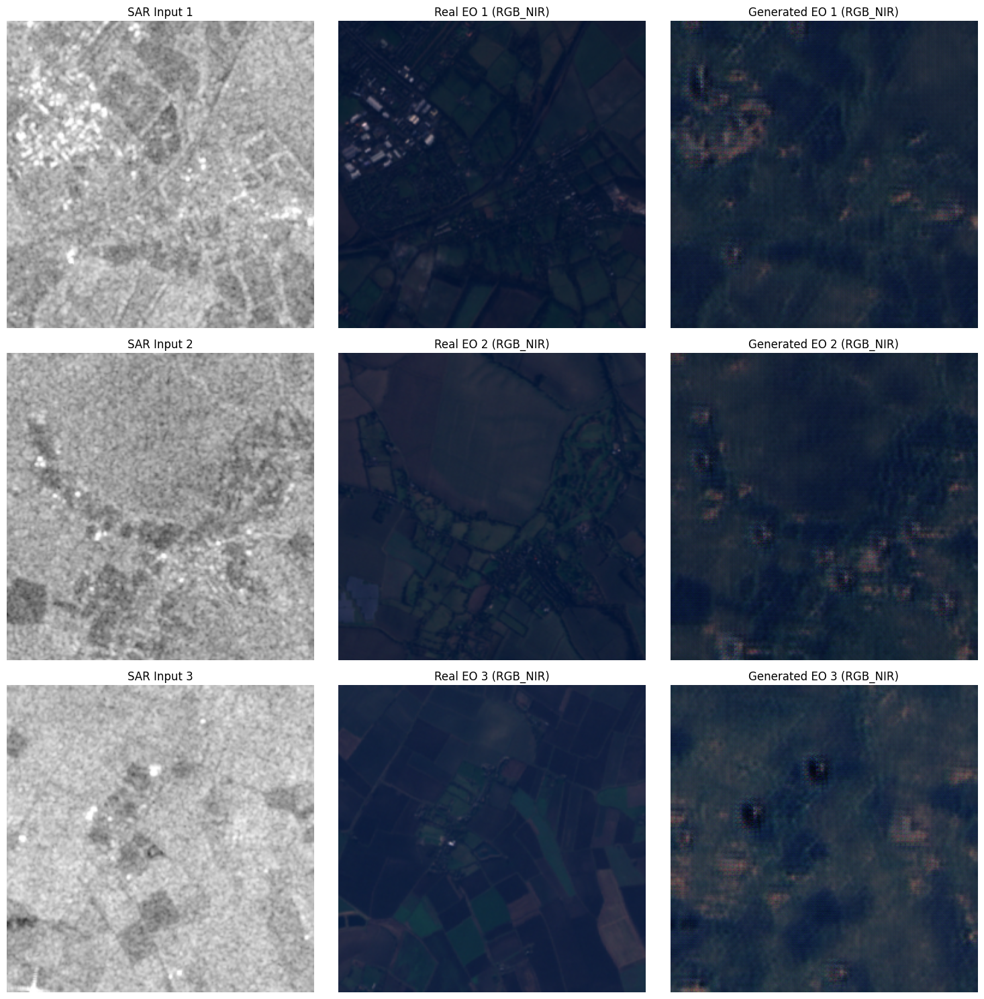


🎉 All configurations trained successfully!


In [ ]:
# Set your dataset path
base_path = '/content/drive/My Drive/split_dataset'


# Train all configurations (2 epochs each)
print("🚀 Starting CycleGAN training for all configurations...")
print("📋 Configurations to train:")
print("  1. SAR → EO (RGB: B4, B3, B2)")
print("  2. SAR → EO (NIR, SWIR, Red Edge: B8, B11, B5)")
print("  3. SAR → EO (RGB + NIR: B4, B3, B2, B8)")
print(f"📁 Using stratified_split")
print(f"⏱️ Training for 2 epochs each")
print(f"🖥️ Device: {device}")

# Execute training
results, metrics = train_all_configurations(
    base_path=base_path,
    split_type='stratified_split',  # Change to 'geographic_split' or 'random_split' as needed
    num_epochs=10,
    batch_size=2
)

print("\n🎉 All configurations trained successfully!")



🏆 FINAL PERFORMANCE SUMMARY - CycleGAN SAR-to-EO Translation

📊 RGB Configuration:
------------------------------------------------------------
🎯 Spectral SSIM (Final Epoch):
   Channel 1: 0.1231
   Channel 2: 0.2197
   Channel 3: 0.3043
   📈 Average SSIM: 0.2157
📡 Spectral PSNR (Final Epoch):
   Channel 1: 12.63 dB
   Channel 2: 16.89 dB
   Channel 3: 18.11 dB
   📈 Average PSNR: 15.88 dB
🌱 NDVI Difference: 0.1290
   (Lower is better - indicates better vegetation preservation)
🔧 Training Stability:
   Final Generator Loss: 5.2569
   Final Cycle Loss: 2.1648

📊 NIR_SWIR_REDEDGE Configuration:
------------------------------------------------------------
🎯 Spectral SSIM (Final Epoch):
   Channel 1: 0.1381
   Channel 2: 0.9122
   Channel 3: 0.2830
   📈 Average SSIM: 0.4445
📡 Spectral PSNR (Final Epoch):
   Channel 1: 12.46 dB
   Channel 2: 52.06 dB
   Channel 3: 15.90 dB
   📈 Average PSNR: 26.81 dB
🌱 NDVI Difference: 0.2156
   (Lower is better - indicates better vegetation preservation)
🔧

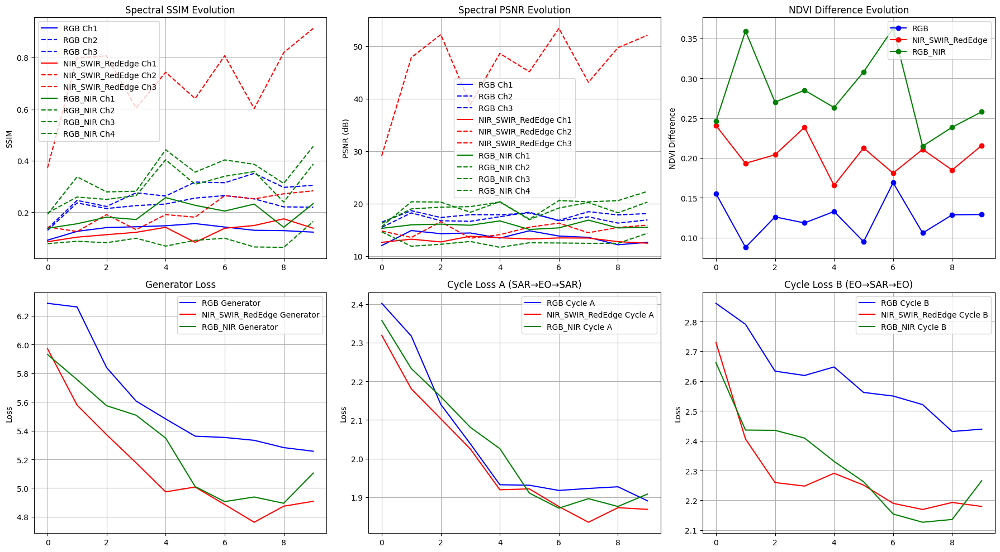


🎨 Generating final comparison visualizations...


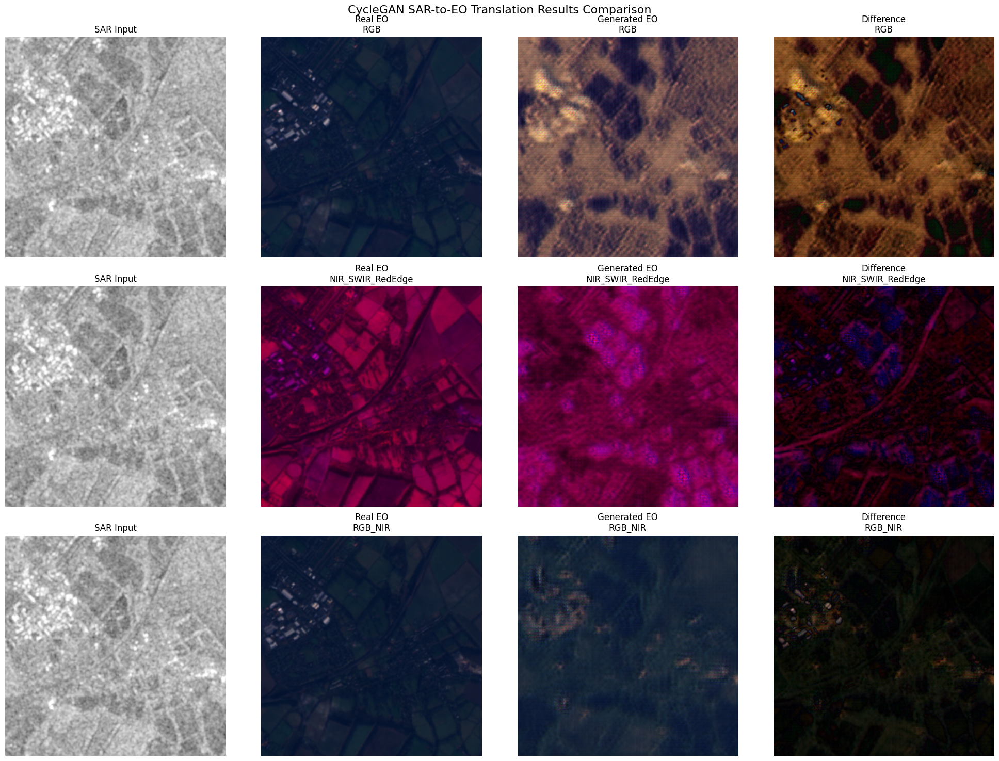


✅ Complete CycleGAN training and analysis finished!
🎯 Key Features Implemented:
   ✓ [-1, 1] normalization for GAN requirements
   ✓ Three spectral configurations trained
   ✓ Spectral-wise SSIM and PSNR metrics
   ✓ NDVI vegetation index preservation
   ✓ Proper postprocessing and visualization
   ✓ Comprehensive performance analysis


In [ ]:
# Comprehensive performance analysis
def print_final_performance_summary(metrics):
    """Print comprehensive performance summary"""

    print("\n" + "="*100)
    print("🏆 FINAL PERFORMANCE SUMMARY - CycleGAN SAR-to-EO Translation")
    print("="*100)

    for config_name, config_metrics in metrics.items():
        print(f"\n📊 {config_name.upper()} Configuration:")
        print("-" * 60)

        # Final SSIM
        if config_metrics['ssim_history']:
            final_ssim = config_metrics['ssim_history'][-1]
            print(f"🎯 Spectral SSIM (Final Epoch):")
            for i, ssim_val in enumerate(final_ssim):
                print(f"   Channel {i+1}: {ssim_val:.4f}")
            print(f"   📈 Average SSIM: {np.mean(final_ssim):.4f}")

        # Final PSNR
        if config_metrics['psnr_history']:
            final_psnr = config_metrics['psnr_history'][-1]
            print(f"📡 Spectral PSNR (Final Epoch):")
            for i, psnr_val in enumerate(final_psnr):
                print(f"   Channel {i+1}: {psnr_val:.2f} dB")
            print(f"   📈 Average PSNR: {np.mean(final_psnr):.2f} dB")

        # NDVI Performance
        if config_metrics['ndvi_history']:
            final_ndvi = config_metrics['ndvi_history'][-1]
            print(f"🌱 NDVI Difference: {final_ndvi:.4f}")
            print(f"   (Lower is better - indicates better vegetation preservation)")
        else:
            print("🌱 NDVI: Not applicable for this band combination")

        # Training stability
        if config_metrics['losses']['loss_G']:
            final_gen_loss = config_metrics['losses']['loss_G'][-1]
            final_cycle_loss = (config_metrics['losses']['loss_cycle_A'][-1] +
                              config_metrics['losses']['loss_cycle_B'][-1]) / 2
            print(f"🔧 Training Stability:")
            print(f"   Final Generator Loss: {final_gen_loss:.4f}")
            print(f"   Final Cycle Loss: {final_cycle_loss:.4f}")

# Execute performance analysis
print_final_performance_summary(metrics)

# Plot comprehensive training metrics
print(f"\n📈 Plotting comprehensive training metrics...")
plot_training_metrics(metrics)

# Generate final comparison visualizations
print(f"\n🎨 Generating final comparison visualizations...")
fig, axes = plt.subplots(len(results), 4, figsize=(20, 5*len(results)))

config_names = list(results.keys())
for i, config_name in enumerate(config_names):
    model = results[config_name]['model']
    dataset = results[config_name]['dataset']

    # Get a sample
    sar_img, real_eo = dataset[0]
    sar_batch = sar_img.unsqueeze(0).to(device)

    # Generate prediction
    model.G_AB.eval()
    with torch.no_grad():
        fake_eo = model.G_AB(sar_batch)

    # Postprocess (denormalize from [-1,1] to [0,1])
    sar_np = denormalize_image(sar_img).cpu().numpy()
    real_eo_np = denormalize_image(real_eo).cpu().numpy()
    fake_eo_np = denormalize_image(fake_eo.squeeze(0)).cpu().numpy()

    # Plot SAR input
    axes[i, 0].imshow(sar_np[0], cmap='gray', vmin=0, vmax=1)
    axes[i, 0].set_title(f'SAR Input')
    axes[i, 0].axis('off')

    # Plot real EO
    if real_eo_np.shape[0] >= 3:
        real_rgb = np.transpose(real_eo_np[:3], (1, 2, 0))
        real_rgb = np.clip(real_rgb, 0, 1)
        axes[i, 1].imshow(real_rgb)
    else:
        axes[i, 1].imshow(real_eo_np[0], cmap='viridis')
    axes[i, 1].set_title(f'Real EO\n{config_name}')
    axes[i, 1].axis('off')

    # Plot generated EO
    if fake_eo_np.shape[0] >= 3:
        fake_rgb = np.transpose(fake_eo_np[:3], (1, 2, 0))
        fake_rgb = np.clip(fake_rgb, 0, 1)
        axes[i, 2].imshow(fake_rgb)
    else:
        axes[i, 2].imshow(fake_eo_np[0], cmap='viridis')
    axes[i, 2].set_title(f'Generated EO\n{config_name}')
    axes[i, 2].axis('off')

    # Plot difference
    if real_eo_np.shape[0] >= 3 and fake_eo_np.shape[0] >= 3:
        diff = np.abs(real_rgb - fake_rgb)
        axes[i, 3].imshow(diff)
    else:
        diff = np.abs(real_eo_np[0] - fake_eo_np[0])
        axes[i, 3].imshow(diff, cmap='hot')
    axes[i, 3].set_title(f'Difference\n{config_name}')
    axes[i, 3].axis('off')

plt.suptitle('CycleGAN SAR-to-EO Translation Results Comparison', fontsize=16)
plt.tight_layout()
plt.show()

print("\n✅ Complete CycleGAN training and analysis finished!")
print("🎯 Key Features Implemented:")
print("   ✓ [-1, 1] normalization for GAN requirements")
print("   ✓ Three spectral configurations trained")
print("   ✓ Spectral-wise SSIM and PSNR metrics")
print("   ✓ NDVI vegetation index preservation")
print("   ✓ Proper postprocessing and visualization")
print("   ✓ Comprehensive performance analysis")
